<a id="top"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#003d99;overflow:hidden"><b>Explain instruct  PIX2PIX diffusion base</b></div>

<a id="top"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#003d99;overflow:hidden"><b>Required Library</b></div>

In [1]:
!git clone https://github.com/huggingface/transformers.git

Cloning into 'transformers'...
remote: Enumerating objects: 240596, done.
remote: Counting objects: 100% (368/368), done.
remote: Compressing objects: 100% (174/174), done.
remote: Total 240596 (delta 196), reused 274 (delta 155), pack-reused 240228 (from 1)
Receiving objects: 100% (240596/240596), 253.11 MiB | 28.60 MiB/s, done.
Resolving deltas: 100% (176046/176046), done.


In [2]:
!pip install diffusers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 29.9 MB/s eta 0:00:00


In [3]:
!pip install sentence-transformers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.7/268.7 kB 4.6 MB/s eta 0:00:00


In [4]:
!pip install torch

In [5]:
!pip install pot

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 865.6/865.6 kB 14.1 MB/s eta 0:00:00


In [6]:
from diffusers import DiffusionPipeline, StableDiffusionInstructPix2PixPipeline, EulerAncestralDiscreteScheduler
import torch
from PIL import Image
import requests
from io import BytesIO

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

from sentence_transformers import SentenceTransformer

import os

from diffusers import StableDiffusionInstructPix2PixPipeline, EulerAncestralDiscreteScheduler
from PIL import Image
from IPython.display import display, Image as Image2
import sys
from transformers import AutoImageProcessor, AutoModel
from PIL import Image
import requests
import cv2
from sklearn.decomposition import TruncatedSVD

from sklearn.linear_model import LinearRegression
from scipy.spatial.distance import cosine
import matplotlib.pyplot as plt
from matplotlib import transforms
import torch
import os
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.linear_model import Lasso
from sklearn.metrics import roc_auc_score
from sklearn.linear_model import Ridge
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from itertools import chain, combinations
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from scipy.stats import wasserstein_distance
from gensim.models import KeyedVectors
from gensim.downloader import load as api_load
from gensim.models import KeyedVectors
from sklearn.metrics.pairwise import euclidean_distances
from scipy.spatial.distance import cdist
from transformers import AutoTokenizer, AutoModel
import torch
import tensorflow as tf
from gensim.models import KeyedVectors
from torch import Generator
import warnings
warnings.filterwarnings('ignore')

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [7]:
#Instruct PIX2PIX
# Initialize the model and pipeline
model_name = "timbrooks/instruct-pix2pix"
pipe = StableDiffusionInstructPix2PixPipeline.from_pretrained(model_name, torch_dtype=torch.float16)
device = "cuda"
pipe.to(device)

model_index.json:   0%|          | 0.00/616 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

safety_checker/config.json:   0%|          | 0.00/4.91k [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/569 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/518 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.02k [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/553 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

StableDiffusionInstructPix2PixPipeline {
  "_class_name": "StableDiffusionInstructPix2PixPipeline",
  "_diffusers_version": "0.31.0",
  "_name_or_path": "timbrooks/instruct-pix2pix",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": false,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "EulerAncestralDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [8]:
#DinoV2
processor = AutoImageProcessor.from_pretrained("facebook/dinov2-base")
model = AutoModel.from_pretrained("facebook/dinov2-base")

preprocessor_config.json:   0%|          | 0.00/436 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

In [9]:
#Word2Vec model
model_path_bin = '/kaggle/input/google_word__/tensorflow2/default/1/GoogleNews-vectors-negative300.bin'
model_txt = KeyedVectors.load_word2vec_format(model_path_bin, binary=True)


<a id="top"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#003d99;overflow:hidden"><b>Inputs</b></div>

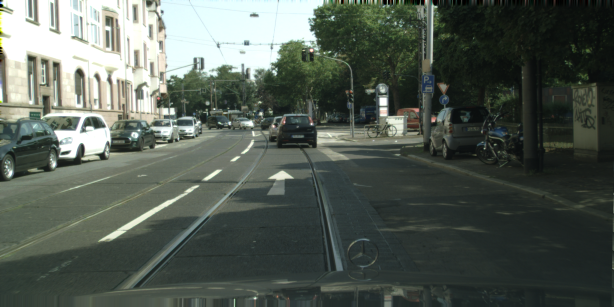

In [10]:
# Load the initial image
url = "/kaggle/input/30images/1(1).png"
init_image = Image.open(url)
display(init_image)

In [11]:
cfg_image = 7.5 # This controls how much the output should resemble the original image
cfg_text = 1.5 # This controls how much the output should follow the text prompt

In [12]:
prompt = "convert this image to winter ###"
words = prompt.split()
words

['convert', 'this', 'image', 'to', 'winter', '###']

<a id="top"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#003d99;overflow:hidden"><b>Generate Original Image with original prompt</b></div>

  0%|          | 0/100 [00:00<?, ?it/s]

Wasserstein distance: 0.023869730090609678


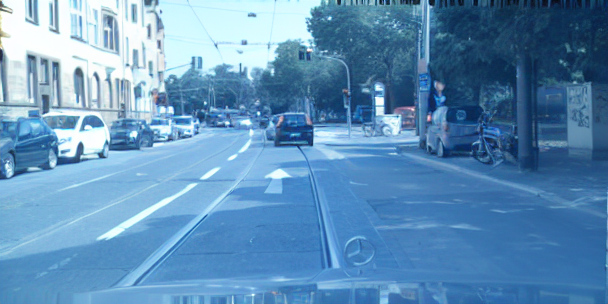

Image generation complete with acceptable Wasserstein distance!


In [13]:
def extract_image_embedding(image, processor, model):
    """Extract embeddings from an image using the DINOv2 model."""
    inputs = processor(images=image, return_tensors="pt")
    with torch.no_grad():
        outputs = model(**inputs)
    embeddings = outputs.last_hidden_state.mean(dim=1).squeeze().cpu().numpy()
    return embeddings

# Set initial Wasserstein distance to a large number
WD_dist_init = float('inf')

# Repeat generation process until Wasserstein distance is less than 0.1
while WD_dist_init > 0.07:
    # Generate the image
    orig_image = pipe(
        prompt=prompt, 
        image=init_image, 
        cfg_image=cfg_image, 
        cfg_text=cfg_text, 
    ).images[0]
    
    
    # Extract embeddings for the original image and initial image
    orig_embedding = extract_image_embedding(orig_image, processor, model)
    init_embedding = extract_image_embedding(init_image, processor, model)
    
    # Calculate Wasserstein distance between the embeddings
    WD_dist_init = wasserstein_distance(orig_embedding, init_embedding)

    print(f'Wasserstein distance: {WD_dist_init}')

    # Save and display the image only if the distance is acceptable
    if WD_dist_init <= 0.07:
        output_path = '/kaggle/working/orig_image.png'  # Set the output path
        orig_image.save(output_path)
        display(orig_image)

print("Image generation complete with acceptable Wasserstein distance!")


<a id="top"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#003d99;overflow:hidden"><b>Generate Perturbaed texts & perturbed Images & compute WD distances between embeddings</b></div>

In [14]:
seed = 1024
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)  # If you're using GPU
torch.backends.cudnn.deterministic = True  # Ensures reproducibility for cuDNN
torch.backends.cudnn.benchmark = False  # Disables the optimized path for better reproducibility
# Set up the text-to-image generator with seed
generator = torch.Generator().manual_seed(seed)

def perturb_text(text_list, perturbation, rng):
    # Initially select items based on perturbation flag
    perturbed_list_initial = [item for item, flag in zip(text_list, perturbation) if flag != 0 and item.strip() != ""]
    
    # Ensure at least two words are included
    if len(perturbed_list_initial) < 2:
        additional_words_needed = 2 - len(perturbed_list_initial)
        available_words = [item for item, flag in zip(text_list, perturbation) if item not in perturbed_list_initial and item.strip() != ""]
        additional_words = rng.choice(available_words, additional_words_needed, replace=False)
        perturbed_list = perturbed_list_initial + list(additional_words)
    else:
        perturbed_list = perturbed_list_initial
    
    return perturbed_list

# Assuming `prompt` and other variables are predefined
words = prompt.split()
text_list = words.copy()

num_perturb = 30
num_words = len(words)

Responses = []
Perturbations = []
# Generate unique perturbations
unique_perturbations = set()
rng = np.random.default_rng(seed)

while len(unique_perturbations) < num_perturb:
    perturbation = tuple(rng.binomial(1, 0.5, size=num_words))  # Convert to tuple for set operations
    
    # Check for uniqueness
    if perturbation not in unique_perturbations:
        unique_perturbations.add(perturbation)
        perturbed_txt = perturb_text(text_list, perturbation, rng)
        corpus = ' '.join(perturbed_txt)
        Responses.append(corpus)  # Store the unique perturbed text
        Perturbations.append(perturbation)  # Store the perturbation vector
        print(f"Perturbation: {perturbation}, Perturbed Text: {corpus}")


Perturbation: (0, 0, 0, 1, 1, 0), Perturbed Text: to winter
Perturbation: (1, 1, 1, 0, 1, 0), Perturbed Text: convert this image winter
Perturbation: (1, 0, 1, 0, 1, 1), Perturbed Text: convert image winter ###
Perturbation: (0, 1, 1, 1, 0, 0), Perturbed Text: this image to
Perturbation: (1, 0, 0, 0, 0, 1), Perturbed Text: convert ###
Perturbation: (1, 1, 1, 1, 1, 1), Perturbed Text: convert this image to winter ###
Perturbation: (0, 0, 1, 0, 0, 0), Perturbed Text: image to
Perturbation: (0, 1, 0, 0, 0, 1), Perturbed Text: this ###
Perturbation: (1, 1, 0, 0, 1, 1), Perturbed Text: convert this winter ###
Perturbation: (1, 1, 0, 1, 1, 1), Perturbed Text: convert this to winter ###
Perturbation: (1, 0, 0, 0, 1, 1), Perturbed Text: convert winter ###
Perturbation: (0, 0, 0, 0, 0, 0), Perturbed Text: to ###
Perturbation: (1, 1, 0, 0, 0, 0), Perturbed Text: convert this
Perturbation: (1, 1, 0, 0, 1, 0), Perturbed Text: convert this winter
Perturbation: (0, 1, 0, 1, 1, 1), Perturbed Text: th

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 1:
Wasserstein distance (generated vs init): 0.024175562020673173
Wasserstein distance (generated vs orig): 0.011667078060630345


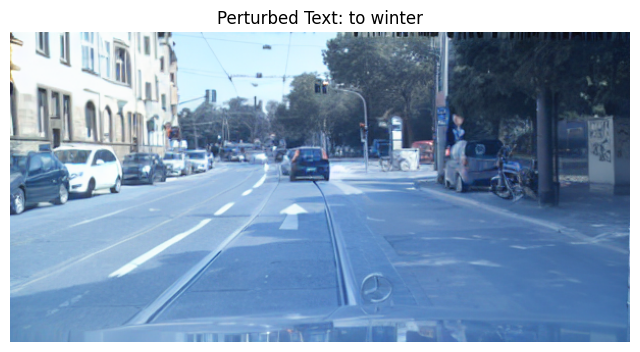

Image generation 1 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 2:
Wasserstein distance (generated vs init): 0.022480669841921035
Wasserstein distance (generated vs orig): 0.013318129119596732


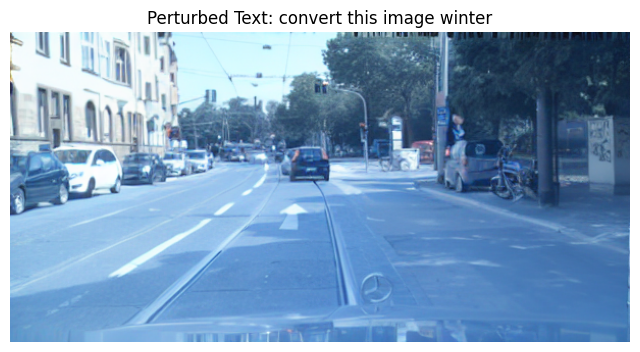

Image generation 2 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 3:
Wasserstein distance (generated vs init): 0.02615648151421133
Wasserstein distance (generated vs orig): 0.01360834906745367


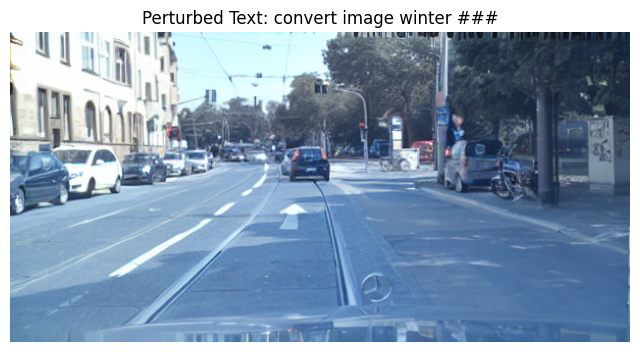

Image generation 3 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 4:
Wasserstein distance (generated vs init): 0.026992992335256843
Wasserstein distance (generated vs orig): 0.009139255107849447


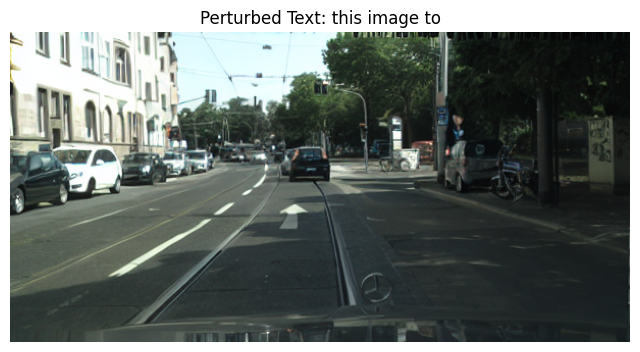

Image generation 4 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 5:
Wasserstein distance (generated vs init): 0.027967421480449665
Wasserstein distance (generated vs orig): 0.008254810825292232


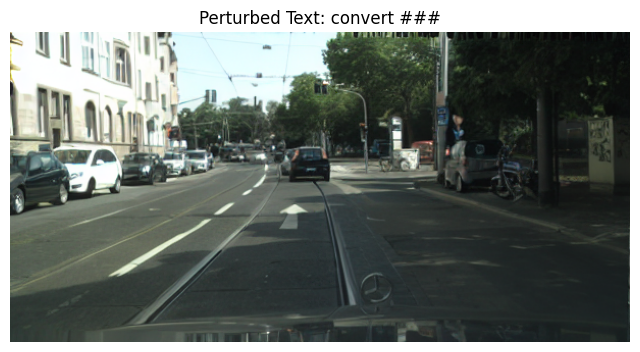

Image generation 5 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 6:
Wasserstein distance (generated vs init): 0.027910949661721432
Wasserstein distance (generated vs orig): 0.012437496692352092


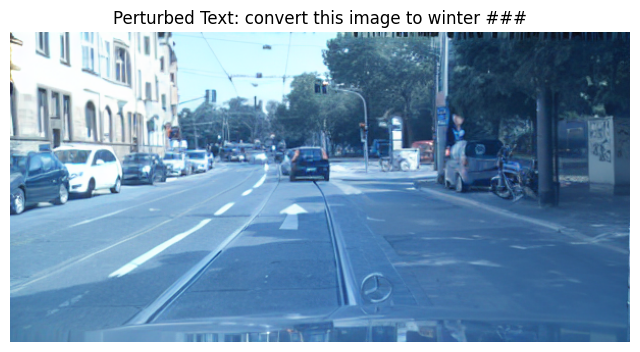

Image generation 6 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 7:
Wasserstein distance (generated vs init): 0.02666890780286243
Wasserstein distance (generated vs orig): 0.009345806405084053


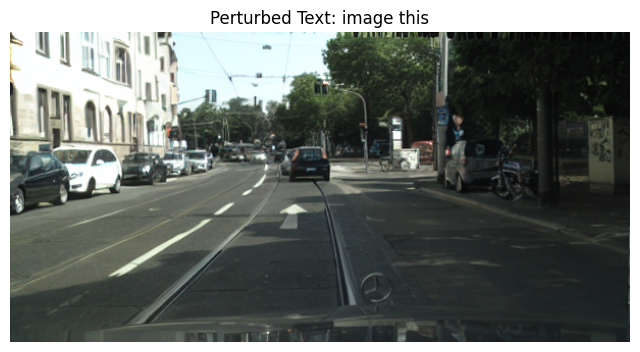

Image generation 7 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 8:
Wasserstein distance (generated vs init): 0.024886192401027088
Wasserstein distance (generated vs orig): 0.006847302413916618


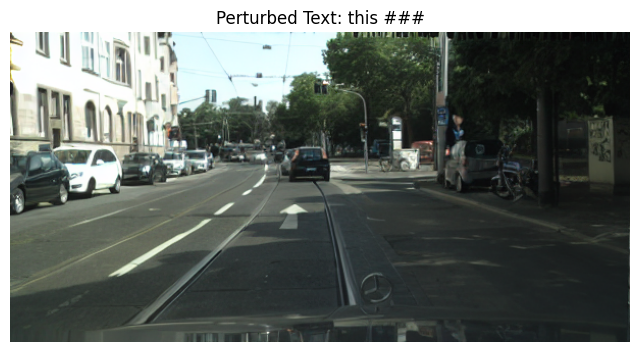

Image generation 8 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 9:
Wasserstein distance (generated vs init): 0.03074922831782109
Wasserstein distance (generated vs orig): 0.013796056952514853


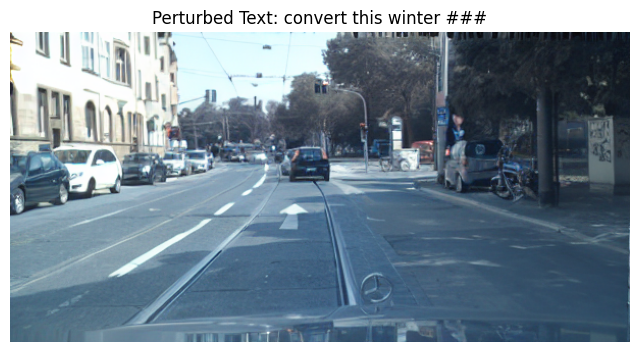

Image generation 9 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 10:
Wasserstein distance (generated vs init): 0.030258847034777638
Wasserstein distance (generated vs orig): 0.018255039101859438


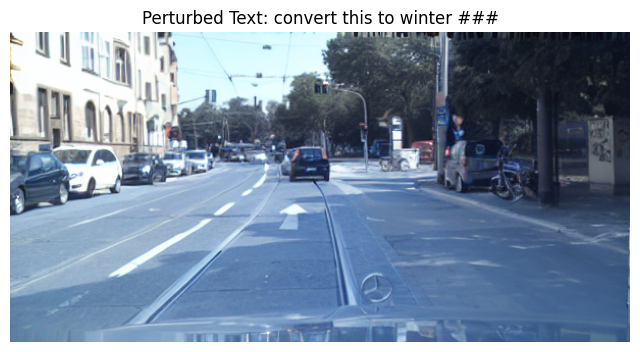

Image generation 10 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 11:
Wasserstein distance (generated vs init): 0.03209656789567816
Wasserstein distance (generated vs orig): 0.015743272425728115


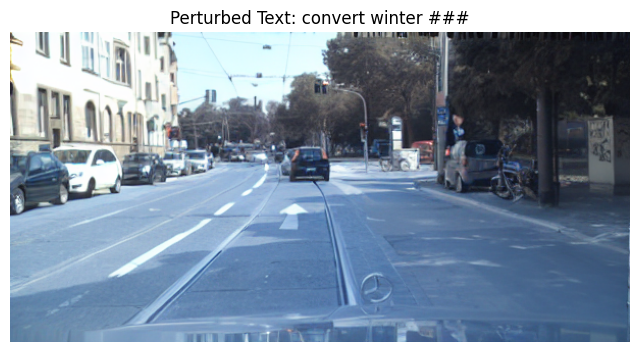

Image generation 11 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 12:
Wasserstein distance (generated vs init): 0.026330739996258987
Wasserstein distance (generated vs orig): 0.011803545011313574


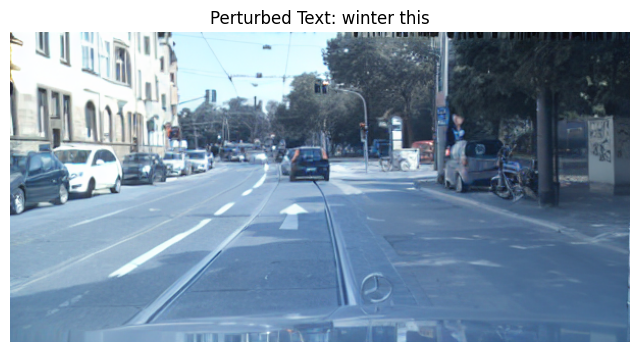

Image generation 12 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 13:
Wasserstein distance (generated vs init): 0.027099335974753565
Wasserstein distance (generated vs orig): 0.008682820316835198


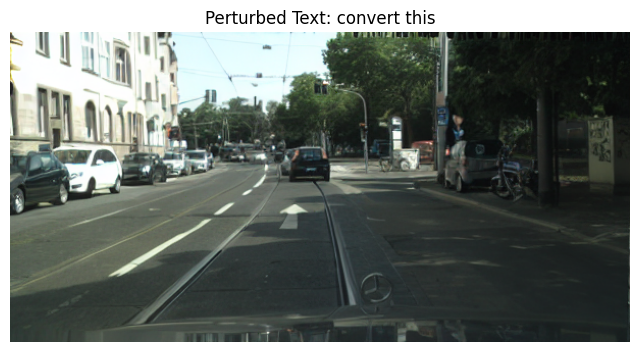

Image generation 13 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 14:
Wasserstein distance (generated vs init): 0.03277213920083947
Wasserstein distance (generated vs orig): 0.016620966655409575


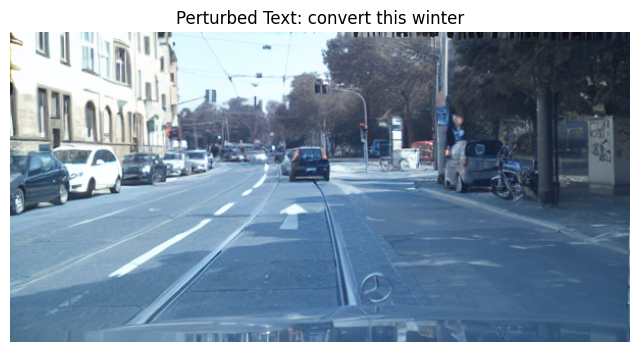

Image generation 14 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 15:
Wasserstein distance (generated vs init): 0.030691982124968337
Wasserstein distance (generated vs orig): 0.013883152119679675


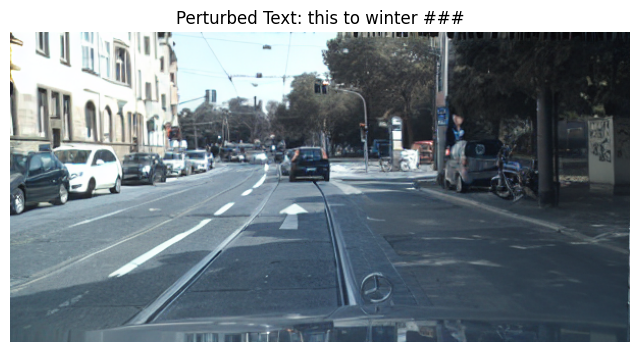

Image generation 15 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 16:
Wasserstein distance (generated vs init): 0.027589018678554577
Wasserstein distance (generated vs orig): 0.008162646731307175


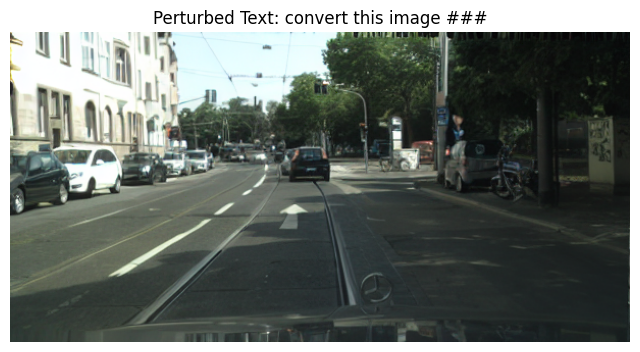

Image generation 16 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 17:
Wasserstein distance (generated vs init): 0.026023535956558902
Wasserstein distance (generated vs orig): 0.017760950511274125


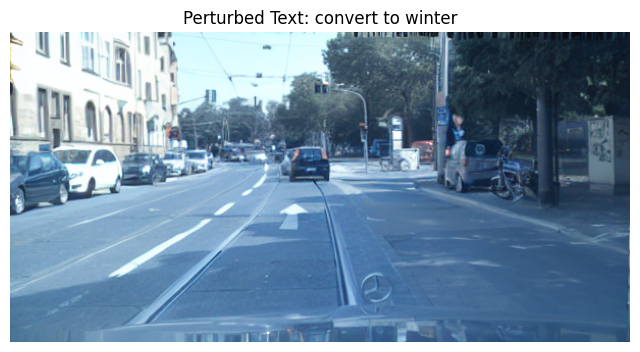

Image generation 17 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 18:
Wasserstein distance (generated vs init): 0.025951534467215744
Wasserstein distance (generated vs orig): 0.008105434692576336


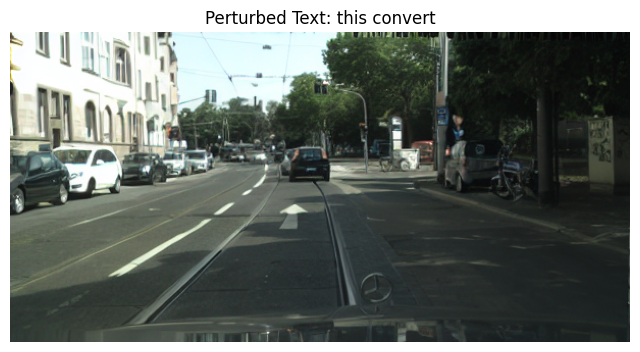

Image generation 18 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 19:
Wasserstein distance (generated vs init): 0.02420850047515919
Wasserstein distance (generated vs orig): 0.016044813766825417


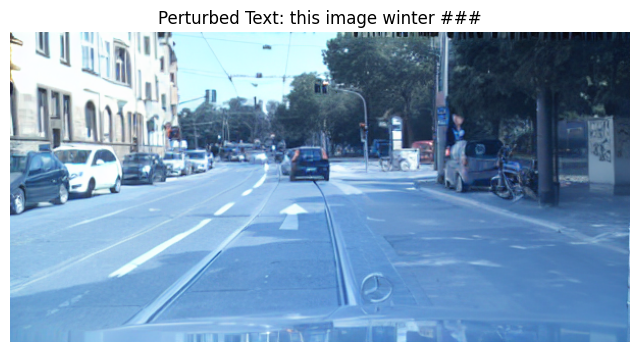

Image generation 19 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 20:
Wasserstein distance (generated vs init): 0.025979813613351638
Wasserstein distance (generated vs orig): 0.013912876017457162


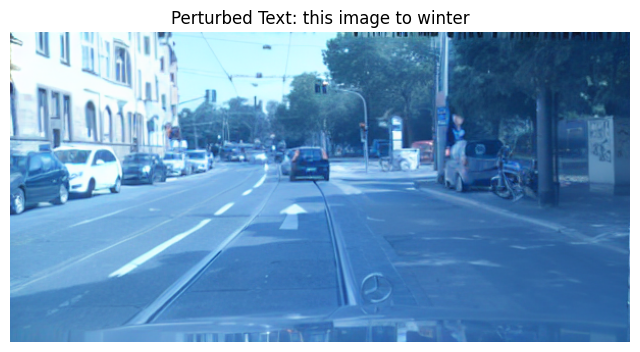

Image generation 20 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 21:
Wasserstein distance (generated vs init): 0.027862770369210935
Wasserstein distance (generated vs orig): 0.01400049612190438


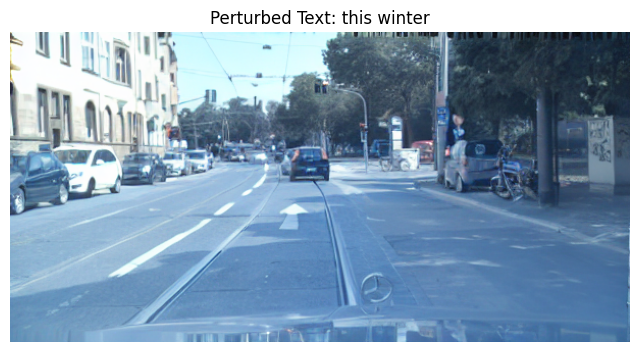

Image generation 21 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 22:
Wasserstein distance (generated vs init): 0.025988697852441827
Wasserstein distance (generated vs orig): 0.00902324318756935


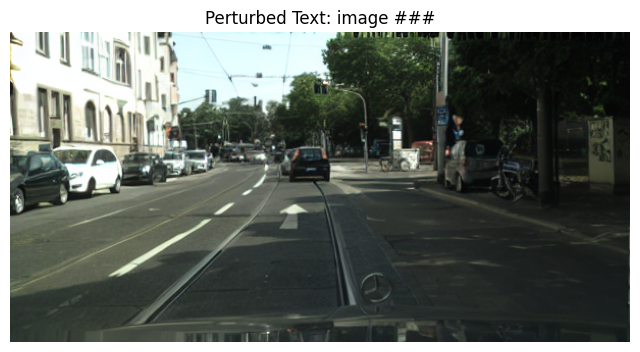

Image generation 22 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 23:
Wasserstein distance (generated vs init): 0.026469569920057754
Wasserstein distance (generated vs orig): 0.007998006515663285


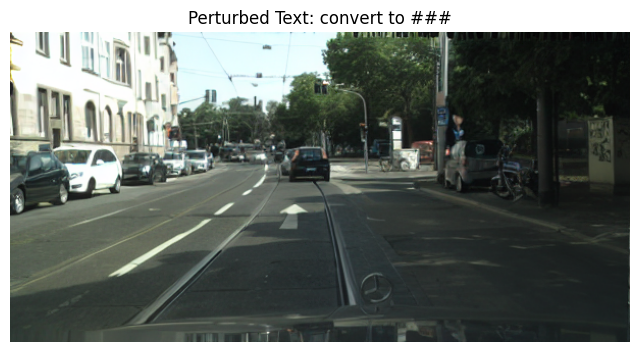

Image generation 23 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 24:
Wasserstein distance (generated vs init): 0.025669766211649403
Wasserstein distance (generated vs orig): 0.01388312488059759


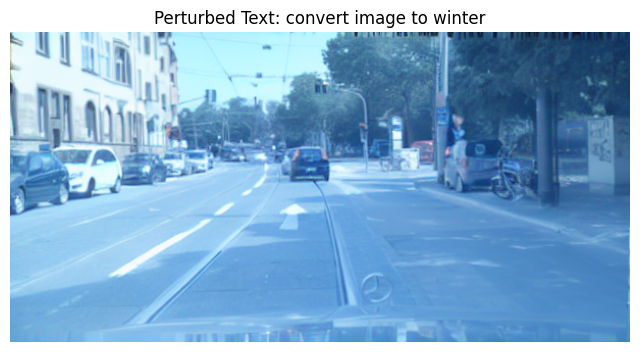

Image generation 24 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 25:
Wasserstein distance (generated vs init): 0.0283956872305377
Wasserstein distance (generated vs orig): 0.008271603646638447


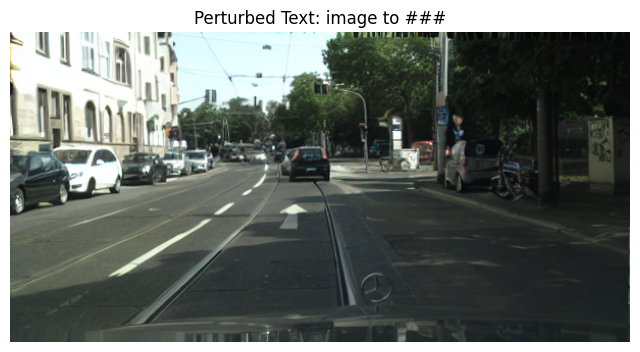

Image generation 25 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 26:
Wasserstein distance (generated vs init): 0.022729585798515483
Wasserstein distance (generated vs orig): 0.015139656057954195


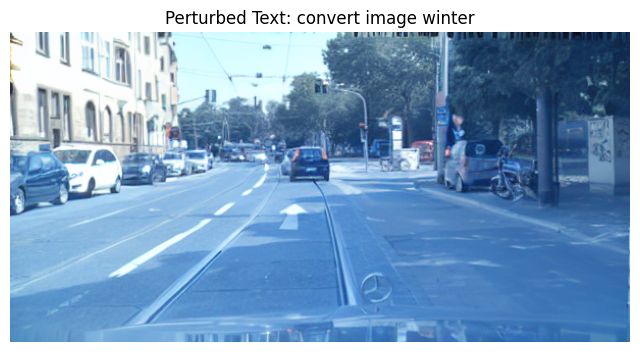

Image generation 26 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 27:
Wasserstein distance (generated vs init): 0.02589349708856998
Wasserstein distance (generated vs orig): 0.009022489044673666


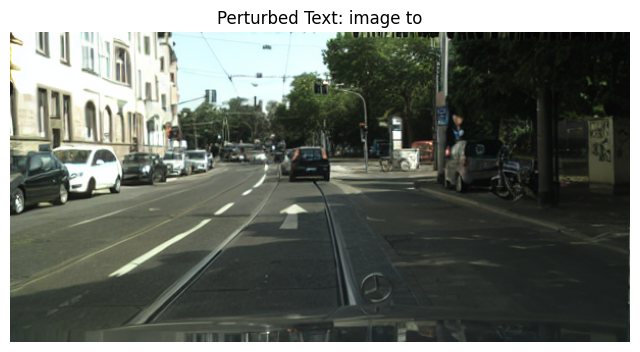

Image generation 27 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 28:
Wasserstein distance (generated vs init): 0.025355124174742137
Wasserstein distance (generated vs orig): 0.016602651866833188


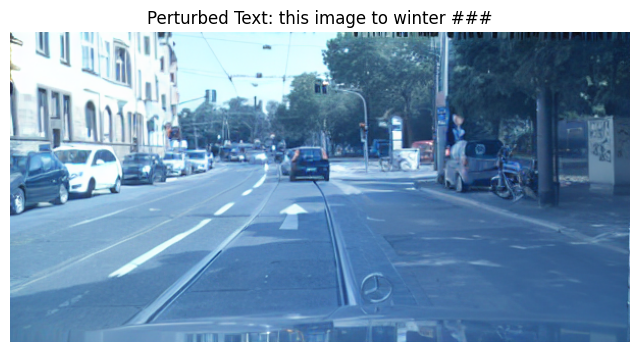

Image generation 28 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 29:
Wasserstein distance (generated vs init): 0.025066617741534493
Wasserstein distance (generated vs orig): 0.015007869438250051


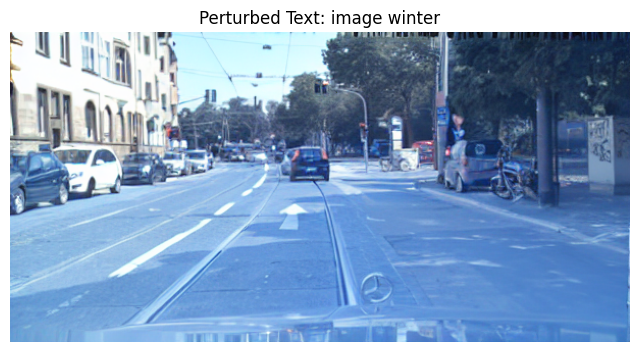

Image generation 29 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 30:
Wasserstein distance (generated vs init): 0.029616044958982485
Wasserstein distance (generated vs orig): 0.012816262365478316


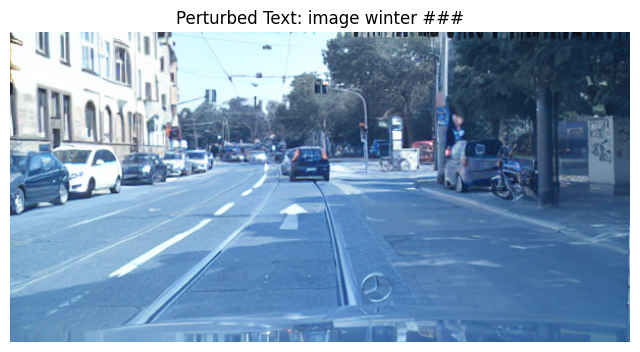

Image generation 30 complete with acceptable Wasserstein distance!


In [15]:
epsilon = 1e-6  # A small value to prevent division by zero
WD_dists_generated_vs_orig = []  # List to store Wasserstein distances

for i, perturbation in enumerate(Perturbations):
    # Generate new text for each perturbation
    perturbed_txt = perturb_text(text_list, perturbation, rng)
    corpus = ' '.join(perturbed_txt)
    
    # Set initial Wasserstein distances for generated image
    WD_dist_generated = float('inf')
    WD_dist_generated_vs_orig_value = float('inf')  # Distance between generated_image and orig_image (temporarily stored inside the loop)

    # Repeat generation process
    while WD_dist_generated > 0.04:  
        # Generate the original image (once, if not already generated)
        orig_image = pipe(
            prompt=corpus,  # Use the perturbed text
            image=init_image, 
            cfg_image=cfg_image, 
            cfg_text=cfg_text,
        ).images[0]

        # Generate another image (generated image)
        generated_image = pipe(
            prompt=corpus,  # Use the perturbed text
            image=init_image, 
            cfg_image=cfg_image, 
            cfg_text=cfg_text,
        ).images[0]

        # Extract embeddings for the generated image, original image, and initial image
        generated_embedding = extract_image_embedding(generated_image, processor, model)
        init_embedding = extract_image_embedding(init_image, processor, model)
        orig_embedding = extract_image_embedding(orig_image, processor, model)

        # Calculate Wasserstein distance between generated image and initial image
        WD_dist_generated = wasserstein_distance(generated_embedding, init_embedding)

        if WD_dist_generated > 0.04:
            print(f"Distance too large (WD_dist_generated = {WD_dist_generated}), regenerating image...")
            continue  # Go back to the beginning of the loop to regenerate the image

        # Calculate Wasserstein distance between generated image and original image
        WD_dist_generated_vs_orig_value = wasserstein_distance(generated_embedding, orig_embedding)

        # Store the Wasserstein distance between the generated image and the original image
        WD_dists_generated_vs_orig.append(WD_dist_generated_vs_orig_value)

        # Display the Wasserstein distances
        print(f"Perturbation {i + 1}:")
        print(f'Wasserstein distance (generated vs init): {WD_dist_generated}')
        print(f'Wasserstein distance (generated vs orig): {WD_dist_generated_vs_orig_value}')

        # Display the image only if the distance is acceptable
        plt.figure(figsize=(8, 8))
        plt.imshow(generated_image)
        plt.title(f"Perturbed Text: {corpus}", fontsize=12)
        plt.axis('off')  # Remove the axes
        plt.show()

        # Save the image to the output path if the distance is acceptable
        output_path = f'/kaggle/working/generated_image_{i + 1}.png'  # Set the output path for each image
        generated_image.save(output_path)
        print(f"Image generation {i + 1} complete with acceptable Wasserstein distance!")
        break  # Exit the loop if the image is acceptable


[0.4225006  0.56723142 0.59267205 0.20091213 0.12338192 0.49003535
 0.21901838 0.         0.60912648 1.         0.77981902 0.43446327
 0.16090115 0.85675752 0.61676123 0.11530283 0.95668829 0.11028763
 0.80625207 0.61936682 0.62704758 0.19074255 0.1008705  0.61675884
 0.12485397 0.72690612 0.19067644 0.85515205 0.71535373 0.52323788]
WMD Scores:

Original vs Perturbed 1: 0.3712
Original vs Perturbed 2: 0.1806
Original vs Perturbed 3: 0.1854
Original vs Perturbed 4: 0.4384
Original vs Perturbed 5: 0.4290
Original vs Perturbed 6: 0.0000
Original vs Perturbed 7: 0.4983
Original vs Perturbed 8: 0.6280
Original vs Perturbed 9: 0.1495
Original vs Perturbed 10: 0.1352
Original vs Perturbed 11: 0.2740
Original vs Perturbed 12: 0.7587
Original vs Perturbed 13: 0.3029
Original vs Perturbed 14: 0.2295
Original vs Perturbed 15: 0.2541
Original vs Perturbed 16: 0.1650
Original vs Perturbed 17: 0.3417
Original vs Perturbed 18: 0.3029
Original vs Perturbed 19: 0.2366
Original vs Perturbed 20: 0.2682


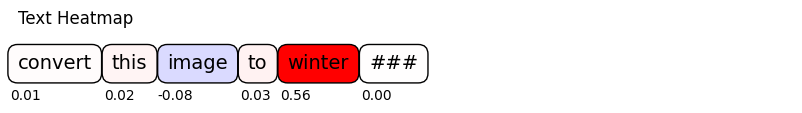

In [16]:
WD_dists_generated_vs_orig = np.array(WD_dists_generated_vs_orig)

# Step 2: Scale the inverse distances between 0 and 1 (Min-Max scaling)
min_WD = np.min(WD_dists_generated_vs_orig)
max_WD = np.max(WD_dists_generated_vs_orig)

Similarities = (WD_dists_generated_vs_orig - min_WD) / (max_WD - min_WD)

# Now Similarities contains the scaled similarities between 0 and 1
print(Similarities)

wmd_scores = {}
all_texts = [prompt] + Responses  # Include the original text (prompt) and all responses (perturbed texts)

for idx, text in enumerate(Responses):  # Loop through all perturbed texts (Responses)
    wmd_score = model_txt.wmdistance(prompt, text)  # Compute WMD between prompt and perturbed text
    wmd_scores[f"Original vs Perturbed {idx+1}"] = wmd_score

# Display the WMD scores
print("WMD Scores:\n")
for key, value in wmd_scores.items():
    print(f"{key}: {value:.4f}")

# Assigning WMD scores to a variable 'distances' for future use
distances = wmd_scores

Perturbations = np.vstack(Perturbations)
distance_values = np.array(list(distances.values()))

kernel_width = 0.25

# Compute weights based on the distances
weights = np.sqrt(np.exp(-(distance_values ** 2) / (kernel_width ** 2)))

# Fit a Linear Regression model
linear_model = LinearRegression()
linear_model.fit(X=Perturbations, y=Similarities, sample_weight=weights)

# Retrieve coefficients from the model
coefficients = linear_model.coef_

# Print the coefficients and weights
print("Coefficients from the Linear Regression model:", coefficients)
print("\nComputed Weights:", weights)

# Function to plot text heatmap
def plot_text_heatmap(words, scores, title="", width=10, height=0.4, verbose=0, max_word_per_line=20, word_spacing=20, score_fontsize=10, save_path=None):
    fig = plt.figure(figsize=(width, height))
    ax = plt.gca()
    ax.set_title(title, loc='left')
    cmap = plt.cm.ScalarMappable(cmap=plt.cm.bwr)
    cmap.set_clim(0, 1)
    canvas = ax.figure.canvas
    t = ax.transData
    normalized_scores = 0.5 * scores / np.max(np.abs(scores)) + 0.5
    loc_y = -0.2
    for i, (token, score) in enumerate(zip(words, scores)):
        *rgb, _ = cmap.to_rgba(normalized_scores[i], bytes=True)
        color = '#%02x%02x%02x' % tuple(rgb)
        text = ax.text(0.0, loc_y, token, bbox={'facecolor': color, 'pad': 5.0, 'linewidth': 1, 'boxstyle': 'round,pad=0.5'}, transform=t, fontsize=14)
        text.draw(canvas.get_renderer())
        ex = text.get_window_extent()
        score_text = ax.text(0.01, loc_y - 1, f"{score:.2f}", transform=t, fontsize=score_fontsize, ha='center')
        score_text.draw(canvas.get_renderer())
        ex_score = score_text.get_window_extent()
        if (i+1) % max_word_per_line == 0:
            loc_y -= 2.5
            t = ax.transData
        else:
            t = transforms.offset_copy(text._transform, x=ex.width + word_spacing, units='dots')
    if verbose == 0:
        ax.axis('off')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

# Define the words for heatmap and save path
words = prompt.split(' ')
save_path = '/kaggle/working/text_heatmap.png'

# Call the function with the save path
plot_text_heatmap(words, coefficients, title="Text Heatmap", save_path=save_path)


In [17]:
!pip install umap-learn plotly numpy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.8/88.8 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 4.7 MB/s eta 0:00:00


In [18]:
import numpy as np
import umap
import plotly.graph_objects as go
from PIL import Image
import os

# Load generated images and their corresponding perturbation sentences
image_dir = '/kaggle/working/'  # Directory where images are stored
generated_images = []
perturbation_sentences = []  # This should hold the exact sentences used for each perturbation

# Load images and sentences
for i in range(1, len(Perturbations) + 1):
    img_path = os.path.join(image_dir, f'generated_image_{i}.png')
    if os.path.exists(img_path):
        img = Image.open(img_path)
        generated_images.append(img)

        # Use the exact perturbation sentence from your perturbation list
        perturbed_txt = perturb_text(text_list, Perturbations[i - 1], rng)
        corpus = ' '.join(perturbed_txt)
        perturbation_sentences.append(corpus)

# Function to convert images to flattened numpy arrays
def image_to_array(image):
    return np.array(image).flatten()

# Create a list to hold the flattened images
image_arrays = []

# Add original image to the list
orig_image = Image.open('/kaggle/working/orig_image.png')  # Load your original image
image_arrays.append(image_to_array(orig_image))

# Append generated images to the list
for img in generated_images:
    image_arrays.append(image_to_array(img))

# Convert to a NumPy array
image_arrays = np.array(image_arrays)

# Apply UMAP to reduce dimensionality to 2D
reducer = umap.UMAP(n_components=2, random_state=42)
umap_embeddings = reducer.fit_transform(image_arrays)

# Create a scatter plot with Plotly
fig = go.Figure()

# Add original image point
fig.add_trace(go.Scatter(
    x=[umap_embeddings[0, 0]], 
    y=[umap_embeddings[0, 1]], 
    mode='markers+text', 
    marker=dict(size=20, color='red'),
    text=['Original Image'],
    hoverinfo='text'
))

# Add generated images points with their corresponding perturbation sentences
for i in range(1, len(image_arrays)):
    # Determine the color based on keywords in the perturbation sentence
    sentence = perturbation_sentences[i - 1]
    color = 'darkgoldenrod'  # Default color for sentences without "snowy" or "weather"
    if 'rainy' in sentence:
        color = 'darkgreen'
    elif 'weather' in sentence:
        color = 'darkorange'
    
    fig.add_trace(go.Scatter(
        x=[umap_embeddings[i, 0]], 
        y=[umap_embeddings[i, 1]], 
        mode='markers',
        marker=dict(size=20, color=color),
        name=f'Image {i}',  # Add a name for the legend
        hovertext=sentence,  # Use hovertext to show sentences
        hoverinfo='text'
    ))

# Configure layout
fig.update_layout(
    title='UMAP Projection of Images',
    xaxis_title='UMAP-1',
    yaxis_title='UMAP-2',
    showlegend=False
)

# Show the figure
fig.show()

In [19]:
WD_dists_generated_vs_orig = np.array(WD_dists_generated_vs_orig)

# Step 1: Compute the inverse of the distances (add a small value to avoid division by zero)
epsilon = 1e-8  # Small value to prevent division by zero
inverse_distances = 1 / (WD_dists_generated_vs_orig + epsilon)

# Step 2: Scale the inverse distances between 0 and 1 (Min-Max scaling)
min_inv = np.min(WD_dists_generated_vs_orig)
max_inv = np.max(WD_dists_generated_vs_orig)

Similarities = (WD_dists_generated_vs_orig - min_inv) / (max_inv - min_inv)

# Now Similarities contains the scaled similarities between 0 and 1
print(Similarities)


[0.4225006  0.56723142 0.59267205 0.20091213 0.12338192 0.49003535
 0.21901838 0.         0.60912648 1.         0.77981902 0.43446327
 0.16090115 0.85675752 0.61676123 0.11530283 0.95668829 0.11028763
 0.80625207 0.61936682 0.62704758 0.19074255 0.1008705  0.61675884
 0.12485397 0.72690612 0.19067644 0.85515205 0.71535373 0.52323788]


<a id="top"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#003d99;overflow:hidden"><b>Compute WMD between texts & Vectors of 0,1</b></div>

In [20]:
wmd_scores = {}
all_texts = [prompt] + Responses  # Include the original text (prompt) and all responses (perturbed texts)

for idx, text in enumerate(Responses):  # Loop through all perturbed texts (Responses)
    wmd_score = model_txt.wmdistance(prompt, text)  # Compute WMD between prompt and perturbed text
    wmd_scores[f"Original vs Perturbed {idx+1}"] = wmd_score

# Display the WMD scores
print("WMD Scores:\n")
for key, value in wmd_scores.items():
    print(f"{key}: {value:.4f}")

# Assigning WMD scores to a variable 'distances' for future use
distances = wmd_scores

WMD Scores:

Original vs Perturbed 1: 0.3712
Original vs Perturbed 2: 0.1806
Original vs Perturbed 3: 0.1854
Original vs Perturbed 4: 0.4384
Original vs Perturbed 5: 0.4290
Original vs Perturbed 6: 0.0000
Original vs Perturbed 7: 0.4983
Original vs Perturbed 8: 0.6280
Original vs Perturbed 9: 0.1495
Original vs Perturbed 10: 0.1352
Original vs Perturbed 11: 0.2740
Original vs Perturbed 12: 0.7587
Original vs Perturbed 13: 0.3029
Original vs Perturbed 14: 0.2295
Original vs Perturbed 15: 0.2541
Original vs Perturbed 16: 0.1650
Original vs Perturbed 17: 0.3417
Original vs Perturbed 18: 0.3029
Original vs Perturbed 19: 0.2366
Original vs Perturbed 20: 0.2682
Original vs Perturbed 21: 0.3811
Original vs Perturbed 22: 0.6364
Original vs Perturbed 23: 0.3744
Original vs Perturbed 24: 0.2314
Original vs Perturbed 25: 0.4335
Original vs Perturbed 26: 0.2755
Original vs Perturbed 27: 0.4983
Original vs Perturbed 28: 0.1737
Original vs Perturbed 29: 0.4312
Original vs Perturbed 30: 0.3281


<a id="top"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#003d99;overflow:hidden"><b>Extract coefficiants</b></div>

In [21]:
Perturbations = np.vstack(Perturbations)
distance_values = np.array(list(distances.values()))

distance_values = np.array(list(distances.values()))

kernel_width = 0.25

# Compute weights based on the distances
weights = np.sqrt(np.exp(-(distance_values ** 2) / (kernel_width ** 2)))

# Fit a Linear Regression model
linear_model = LinearRegression()
linear_model.fit(X=Perturbations, y= Similarities, sample_weight=weights)

# Retrieve coefficients from the model
coefficients = linear_model.coef_

# Print the coefficients and weights
print("Coefficients from the Linear Regression model:", coefficients)
print("\nComputed Weights:", weights)


Coefficients from the Linear Regression model: [ 0.00733115  0.02180763 -0.08188515  0.02774056  0.55719253  0.00323089]

Computed Weights: [0.33211744 0.77023517 0.75955045 0.21490778 0.22931758 1.
 0.13717757 0.0426244  0.83628726 0.86394782 0.54848025 0.01000082
 0.48004477 0.65614583 0.59648965 0.80434123 0.39298814 0.48004477
 0.63891752 0.56256258 0.31281772 0.03918144 0.32583302 0.65162531
 0.22236959 0.5447955  0.13717757 0.78552895 0.22588851 0.42264537]


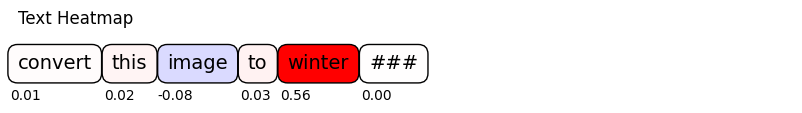

In [22]:
def plot_text_heatmap(words, scores, title="", width=10, height=0.4, verbose=0, max_word_per_line=20, word_spacing=20, score_fontsize=10, save_path=None):
    fig = plt.figure(figsize=(width, height))
    ax = plt.gca()
    ax.set_title(title, loc='left')
    cmap = plt.cm.ScalarMappable(cmap=plt.cm.bwr)
    cmap.set_clim(0, 1)
    canvas = ax.figure.canvas
    t = ax.transData
    normalized_scores = 0.5 * scores / np.max(np.abs(scores)) + 0.5
    loc_y = -0.2
    for i, (token, score) in enumerate(zip(words, scores)):
        *rgb, _ = cmap.to_rgba(normalized_scores[i], bytes=True)
        color = '#%02x%02x%02x' % tuple(rgb)
        text = ax.text(0.0, loc_y, token, bbox={'facecolor': color, 'pad': 5.0, 'linewidth': 1, 'boxstyle': 'round,pad=0.5'}, transform=t, fontsize=14)
        text.draw(canvas.get_renderer())
        ex = text.get_window_extent()
        score_text = ax.text(0.01, loc_y - 1, f"{score:.2f}", transform=t, fontsize=score_fontsize, ha='center')
        score_text.draw(canvas.get_renderer())
        ex_score = score_text.get_window_extent()
        if (i+1) % max_word_per_line == 0:
            loc_y = loc_y - 2.5
            t = ax.transData
        else:
            t = transforms.offset_copy(text._transform, x=ex.width + word_spacing, units='dots')
    if verbose == 0:
        ax.axis('off')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()
    words = "make this image snowy.".split(' ')
# Define the save path for Kaggle output
save_path = '/kaggle/working/text_heatmap.png'

# Call the function with the save_path
plot_text_heatmap(words, coefficients, title="Text Heatmap", save_path=save_path)